#### Delete the following cell code if it causes any issue. (It turns off scrolling in output cells of notebook).

In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

## Please ensure these packages are installed in order to run the program
* NumPy
* Matplotlib
* Pillow

In [2]:
# Imports required for the project. 
import numpy as np
import matplotlib.pyplot as plt
from sys import getsizeof
from PIL import Image
import os
%matplotlib inline

### General Functions that are used later on.

In [3]:
# Set notebook to full width
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

"""
Function to open an image in either RGB or grayscale and return it as np array.
Returns: Image as np array.
"""
def open_image(name, gray = False):
    img = Image.open(name)
    img.save('test.png')
    if gray:
        img = img.convert('L')
    return np.asarray(img)

In [4]:
"""
Function to mean center the image data.
Returns: The centered image array and an array containing the mean values for each channel.
"""
def mean_center(img):
    means = []
    means = np.mean(img, axis=(0,1))
    img_c = img - means
    return (img_c, means)
    if len(img.shape) == 3:
        for i in range(img.shape[-1]):
            means.append(np.mean(img[:,:,i]))
            img_c.append(img[:,:,i] - means[-1])
    elif len(img.shape) == 2:
        means.append(np.mean(img))
        img_c.append(img - means[-1])
    return (img_c, means)

In [5]:
"""
Helper function to display a single image using PIL.
Returns: None
"""
def output_image(img, title='Original_Image'):
    pic = np.copy(img)
    pic.astype(np.uint8)
    if pic.shape[-1] == 3:
        pic = Image.fromarray(pic, 'RGB')
        plt.imshow(pic)
        plt.title(title)
        plt.show()
    elif pic.shape[-1] == 1:
        plt.imshow(pic[:,:,-1], cmap='gray')
        plt.title(title)
        plt.show()
"""
Helper function to display the original image, recreated image and the difference
at the same time using sub-plots and PIL library.
Returns: None
"""
def output_image_all(org, rec, diff):
    o_pic = np.copy(org)
    r_pic = np.copy(rec)
    d_pic = np.copy(diff)

    o_pic = o_pic.astype(np.uint8)
    r_pic = r_pic.astype(np.uint8)
    d_pic = d_pic.astype(np.uint8)
    for i in range(org.shape[-1]):
        o_pic[-1] = o_pic[-1].astype(np.uint8)
        r_pic[-1] = r_pic[-1].astype(np.uint8)
        d_pic[-1] = d_pic[-1].astype(np.uint8)
    if o_pic.shape[-1] == 3:
        o_pic = Image.fromarray(o_pic, 'RGB')
        r_pic = Image.fromarray(r_pic, 'RGB')
        d_pic = Image.fromarray(d_pic, 'RGB')
        fig_size = [None, None]
        fig_size[0] = 14
        fig_size[1] = 14
        plt.rcParams["figure.figsize"] = fig_size
        plt.subplot(131)
        plt.imshow(o_pic)
        plt.title('Original')
        plt.subplot(132)
        plt.imshow(r_pic)
        plt.title('Compressed')
        plt.subplot(133)
        plt.imshow(d_pic)
        plt.title('Difference')
        plt.show()
    elif o_pic.shape[-1] == 1:
        fig_size = [None, None]
        fig_size[0] = 14
        fig_size[1] = 14
        plt.rcParams["figure.figsize"] = fig_size
        plt.subplot(131)
        plt.imshow(o_pic[:,:,-1], cmap='gray')
        plt.title('Original')
        plt.subplot(132)
        plt.imshow(r_pic[:,:,-1], cmap='gray')
        plt.title('Compressed')
        plt.subplot(133)
        plt.imshow(d_pic[:,:,-1], cmap='gray')
        plt.title('Difference')
        plt.show()

In [6]:
"""
Function returns SVD of the image data. Uses np.linalg.svd library function.
Returns: The SVD components of the image data.
"""
def compute_svd(img):
    U, S, Vh = np.zeros((img.shape[0],img.shape[0], img.shape[-1])), np.zeros((min(img.shape[0],img.shape[1]),img.shape[-1])), \
    np.zeros((img.shape[1],img.shape[1], img.shape[-1]))
    for i in range(img.shape[-1]):
        U[:,:,i], S[:,i], Vh[:,:,i] = np.linalg.svd(img[:,:,i])
    return U, S, Vh

"""
Function that truncates the SVD of data dependent on the number of singular values
used, i.e. num_sv.
Returns: The SVDs of each dimension/channel of the image data.
"""
def reduce_dimensions(U, S, Vh, num_sv):
    svds = []
    if not isinstance(num_sv, (list,)):
        num_sv = [num_sv] * U.shape[-1]
    for i in range(U.shape[-1]):
        # Reduce U
        a = U[:,:num_sv[i],i]
        # Get S
        b = np.zeros((num_sv[i], num_sv[i]))
        np.fill_diagonal(b, S[:,i][:num_sv[i]])
        # Reduce Vh
        c = Vh[:num_sv[i],:,i]
        svds.append((a, b, c))
    return svds

In [7]:
"""
Function recreates the image data from the SVD components.
Returns: Recreated image as np array.
"""
def recreate_img(svds, means = None, centered = True):
    rec = np.zeros((svds[0][0].shape[0], svds[0][2].shape[1], len(svds)))
    for i in range(len(svds)):
        red_U, red_S, red_V = svds[i]
        r = np.matmul(np.matmul(red_U,red_S),red_V)
        if centered:
            assert means is not None
            r = r + means[i]
        rec[:,:,i] = r
    # Ensure every value is within 0 and 255 inclusive.
    # Otherwise later, this causes noise to creep when transforming it to uint8.
    rec[rec > 255] = 255
    rec[rec < 0] = 0
    return (rec)

In [8]:
"""
Function to compute the Peak Signal-to-Noise Ratio (PSNR) between original
and recreated image.
This is the measure of the quality of the compression.
Returns: Computed PSNR and MSE.
"""
def compute_psnr(diff):
    dim = diff.shape[-1]
    mse = 0
    for i in range(dim):
        mse = mse + np.sum(diff[:,:,i] ** 2) / (diff.shape[0] * diff.shape[1])
    mse = mse / dim
    PSNR = 10 * np.log10(255 ** 2 / mse)
    return (PSNR, mse)

### Method to compress image using SVD in a non-adaptive fashion.

In [9]:
"""
Function that compresses the image data using SVD, in a non-adaptive way.
That is, it uses a single k value to determine the number of singular values
to use.

Parameters:
-----------
image(np array): The image data, can be 2D for grayscale or 3D for RGB.
k(int): The number of singular values to consider.
center(boolean): Flag to determine if the data is to be mean-centered
show_report(boolean): Flag to determine if the function should print 
out the report and the recreated images.

Returns:
---------
Recreated Image array --> np array, 
Original Image array --> np array, 
Report of the Compression --> dictionary.

N.B.: Statistics returned as a dictionary. Stats include PSNR and MSE values.
Used to plot later.
"""

def compress_non_adaptive(image, k = 32, center = True, show_report = True):
    # Copy original image to temp variable
    org = np.copy(image)
    if len(image.shape) == 2:
        org = np.reshape(org, image.shape + (1,))
    assert len(org.shape) == 3
    if center:
        img_c, img_means = mean_center(org)
    else:
        img_c = org
    U, S, Vh = compute_svd(img_c)
    svds = reduce_dimensions(U, S, Vh, k)
    if center:
        rec = recreate_img(svds, img_means)
    else:
        rec = recreate_img(svds, means=None, centered=center)
    
    diff = np.zeros(org.shape)

    for i in range(org.shape[-1]):
        r = rec[:,:,i]
        o = org[:,:,i]
        diff[:,:,i] = np.abs(o - r)
    
    psnr, mse = compute_psnr(diff)
    if show_report:
        print('Compression Using Normal Technique With k =',k)
        output_image_all(org, rec, diff)
        print('PSNR Value:', psnr)
        print('MSE of Image difference:',mse)
    stats = {'psnr':psnr, 'mse':mse}
    if rec.shape[-1] == 1:
        rec = rec[:,:,-1]
    return (rec, image, stats)

## Demonstrating Non-Adaptive Image Compression using different k values

(512, 512, 3)
Demonstrating Non-adaptive Compression Using SVD
Compression Using Normal Technique With k = 8


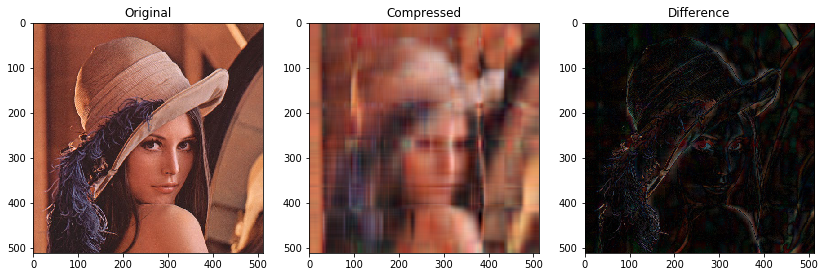

PSNR Value: 22.2338065581
MSE of Image difference: 388.776230894
Compression Using Normal Technique With k = 32


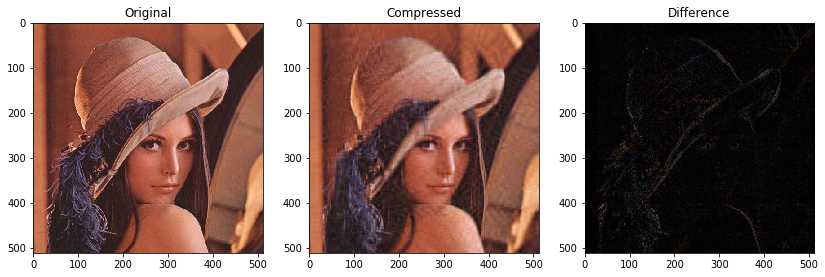

PSNR Value: 27.3104144071
MSE of Image difference: 120.792208058
Compression Using Normal Technique With k = 255


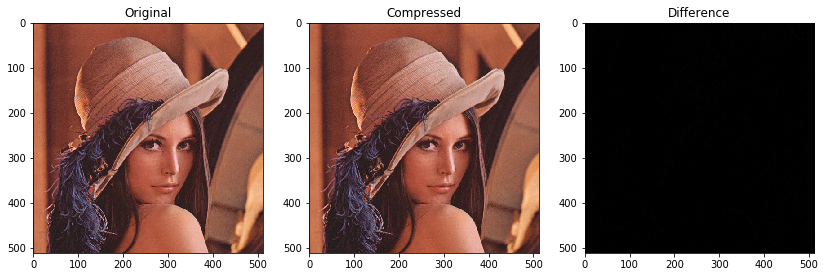

PSNR Value: 45.0132978166
MSE of Image difference: 2.04998450874


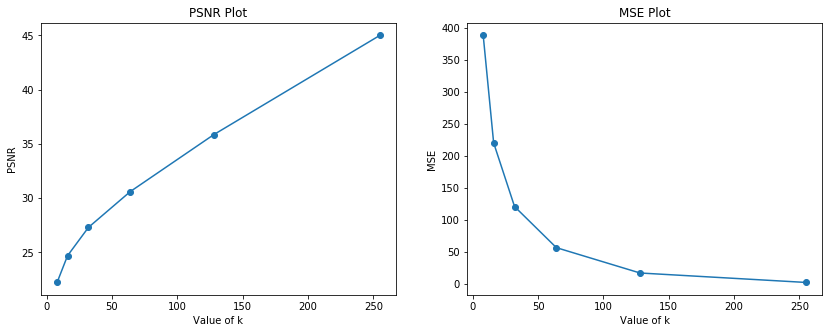

In [10]:
"""
If required, change the image file name here.
Change the "gray" flag to toggle grayscale/RGB image testing.
"""
lenna = open_image('lenna.jpg', gray=False)
print(lenna.shape)
print('Demonstrating Non-adaptive Compression Using SVD')
SHAPE = (lenna.shape[0],lenna.shape[1])

"""
k_vals contains a list of values of k to test on the image taken above.
Toggle "center" flag to do SVD on centered/uncentered image data.
Change as required.
"""
psnr_nc = []
mse_nc = []
k_vals = (8, 16, 32, 64, 128, 255)
for i in k_vals:
    rep = False
    if i in (8, 32, 255):
        rep = True
    rec, org, stats = compress_non_adaptive(lenna, k = i, center=True, show_report=rep)
    psnr_nc.append(stats['psnr'])
    mse_nc.append(stats['mse'])
    
plt.rcParams["figure.figsize"] = [14,5]
plt.subplot(121)
plt.title('PSNR Plot')
plt.xlabel('Value of k')
plt.ylabel('PSNR')
plt.plot(k_vals, psnr_nc,'-o');
plt.subplot(122)
plt.title('MSE Plot')
plt.xlabel('Value of k')
plt.ylabel('MSE')
plt.plot(k_vals, mse_nc, '-o');

### Showing for grayscale image

(512, 512)
Compression Using Normal Technique With k = 16


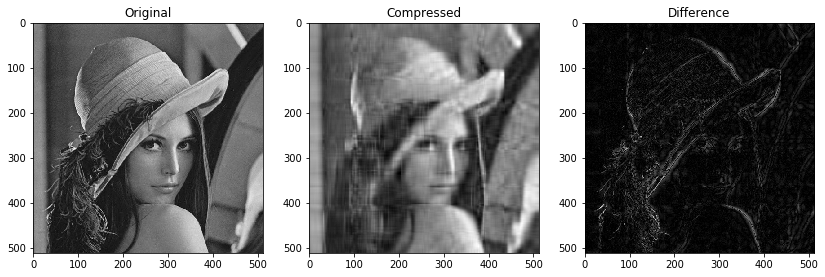

PSNR Value: 25.0428325738
MSE of Image difference: 203.609062145


In [11]:
"""
Open image of choice, simply change file name here. Checking for grayscale.
Change the "gray" flag to toggle grayscale/RGB image testing.
"""
lenna = open_image('lenna.jpg', gray=True)
print(lenna.shape)
SHAPE = (lenna.shape[0],lenna.shape[1])

psnr = []
mse = []
k_vals = (16,)
"""
k_vals contains a list of values of k to test on the image taken above.
Toggle "center" flag to do SVD on centered/uncentered image data.
"""
for i in k_vals:
    rec, org, stats = compress_non_adaptive(lenna, k = i, center=False)
    psnr.append(stats['psnr'])
    mse.append(stats['mse'])
if len(k_vals) > 2:
    plt.subplot(121)
    plt.title('PSNR Plot')
    plt.xlabel('Value of k')
    plt.ylabel('PSNR')
    plt.plot(k_vals, psnr,'-o')
    plt.subplot(122)
    plt.title('MSE Plot')
    plt.xlabel('Value of k')
    plt.ylabel('MSE')
    plt.plot(k_vals, mse, '-o')

### Code to implement adaptive SVD image compression using grids.

In [12]:
"""
Function to compute cumulative sum of an array. 
Returns: Array of cumulative sum values.
"""
def compute_cum_sum(S):
    return np.cumsum(S)

In [13]:
"""
Function to compress the image using the adaptive grid technique. Requires grid size, threshold percentage.

Parameters:
-----------
image(np array): Image data in array form. Can be 2D for grayscale or 3D for RGB.
grid_size(tuple): Gives the grid size to create the blocks in the image.
perc_t(float): The fraction of the cumulative sum of the singular values to consider.
center(bool): Flag to determine if it is required to center the image data.
show_report(bool): Flag to determine if the function should print the report and the resultant images.

Returns: 
---------
Recreated image array --> np array, 
Original image array --> np array,
Statistics --> dictionary.

N.B.: The statistics are returned as a dictionary. Contains average rank used, percentage rank used, 
PSNR and MSE. Used for plotting later.
"""
def compress_by_grid(image, grid_size = (16,16), perc_t = 0.5, center = True, show_report=True):
    shape_1 = image.shape[0]
    shape_2 = image.shape[1]
    # Determine number of grids dependent on grid size.
    num_grid_by_row = shape_1 // grid_size[0]
    num_grid_by_col = shape_2 // grid_size[1]
    # Copy original image
    org = np.copy(image)
    # Reshape grayscale images to 3D for ease of processing
    if len(image.shape) == 2:
        org = np.reshape(org, image.shape + (1,))
    assert len(org.shape) == 3
    rec = np.zeros(org.shape)
    # Center data if required
    if center:
        image_c, image_means = mean_center(org)
    else:
        image_c = org
        image_means = None
    # Lists to keep track of ranks and percentage of ranks used per block
    ranks = []
    perc_ranks = []
    cmp_ratios = []
    # Process
    for i in range(0, num_grid_by_row + 1):
        start_i, end_i = i*grid_size[0], min((i+1)*grid_size[0],shape_1)
        if start_i == end_i:
            break
        for j in range(0, num_grid_by_col + 1):
            start_j, end_j = j*grid_size[1], min((j+1)*grid_size[1],shape_2)
            
            if start_j == end_j:
                break
            # Extract block and do SVD
            block = np.zeros(grid_size + (org.shape[-1],))
            block = image_c[start_i:end_i,start_j:end_j, :]
            U, S, Vh = compute_svd(block)
            k = []
            # Determine number of singular values based on cumulative sum and perc_t
            for x in range(S.shape[-1]):
                cum_sum = compute_cum_sum(S[:,x])
                sums = cum_sum[-1]
                v = sums * perc_t
                l = 1
                y = len(cum_sum)-2
                while y >= 0:
                    if (cum_sum[y] <= v) and (cum_sum[y+1] >= v):
                        break 
                    y = y - 1
                k.append(y + 2)
                ranks.append(y + 2)
                perc_ranks.append((y + 2) / min(grid_size[0], grid_size[1]))
            svds = reduce_dimensions(U, S, Vh, k)
            # Recreate image
            if center:
                rc1 = recreate_img(svds, image_means)
            else:
                rc1 = recreate_img(svds, means=None, centered=center)  
            rec[start_i:end_i,start_j:end_j,:] = rc1 
    ranks = np.array(ranks)
    perc_ranks = np.array(perc_ranks)
    avg_rank = np.mean(ranks)
    perc_rank = np.mean(perc_ranks)
    diff = np.zeros(org.shape)
    
    # Take difference of original and recreated image.
    for i in range(org.shape[-1]):
        r = rec[:,:,i]
        o = org[:,:,i]
        diff[:,:,i] = np.abs(o - r)
    psnr, mse = compute_psnr(diff)
    if show_report:
        print('Compression Using Grid Technique With grid =',grid_size,"and ratio of sum =",(perc_t))
        output_image_all(org, rec, diff)
        print("Average Rank Used: %.2f" %avg_rank)
        print("Average Percentage of Ranks Used: %.3f%%" %(perc_rank * 100))
        print('PSNR Value:', psnr)
        print('MSE of Image difference:',mse)
    if rec.shape[-1] == 1:
        rec = rec[:,:,-1]
    stats = {'avg_rank':avg_rank, 'perc_rank':(perc_rank*100), 'psnr':psnr, 'mse':mse}
    return (rec, image, stats)

## Demonstrating Adaptive Compression Using Grid System

### 1. Showing effect of varying grid size with constant percentage of cumulative sum of Singular Values (55%)
####    We also see the effects of centering the image data

(512, 512, 3)
Compression Using Grid Technique With grid = (8, 8) and ratio of sum = 0.55


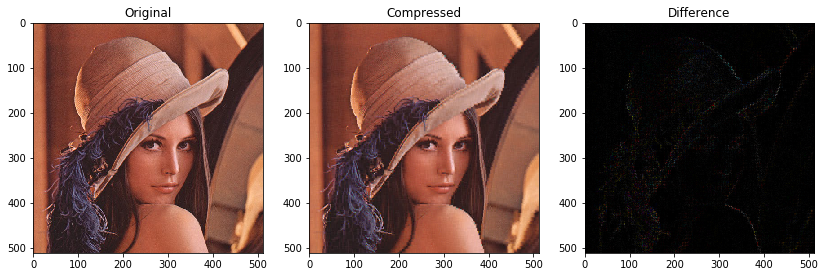

Average Rank Used: 1.20
Average Percentage of Ranks Used: 14.998%
PSNR Value: 30.8610597915
MSE of Image difference: 53.3303435909


Compression with no centering of data
Compression Using Grid Technique With grid = (8, 8) and ratio of sum = 0.55


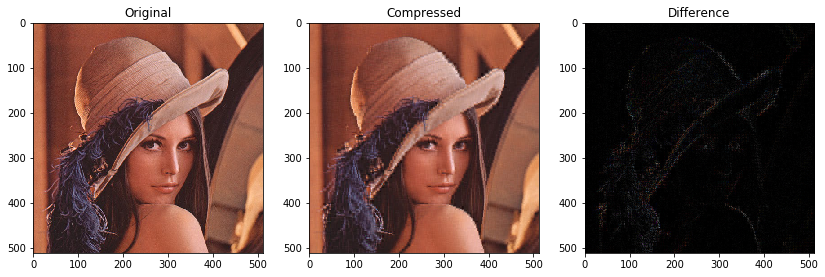

Average Rank Used: 1.00
Average Percentage of Ranks Used: 12.525%
PSNR Value: 29.2045123459
MSE of Image difference: 78.0960604146
Compression Using Grid Technique With grid = (32, 32) and ratio of sum = 0.55


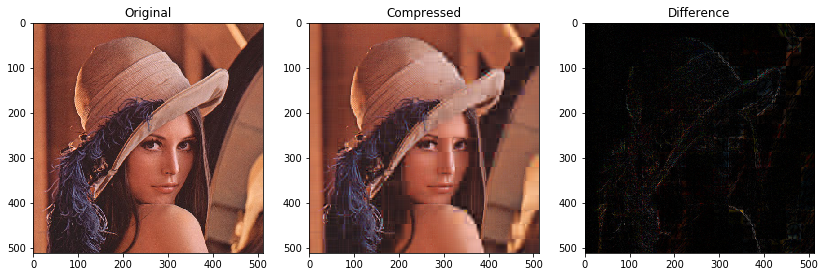

Average Rank Used: 2.56
Average Percentage of Ranks Used: 7.987%
PSNR Value: 27.9435830279
MSE of Image difference: 104.405182793


Compression with no centering of data
Compression Using Grid Technique With grid = (32, 32) and ratio of sum = 0.55


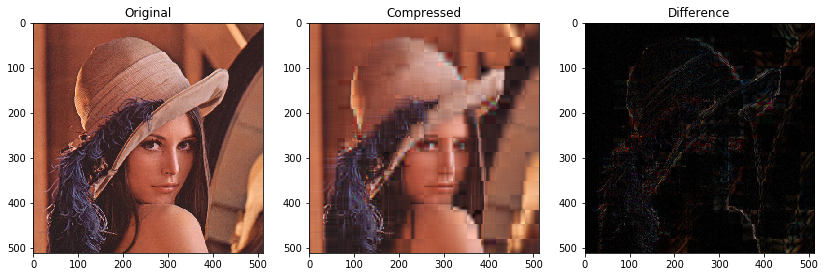

Average Rank Used: 1.26
Average Percentage of Ranks Used: 3.947%
PSNR Value: 25.1833555212
MSE of Image difference: 197.126408182
Compression Using Grid Technique With grid = (64, 64) and ratio of sum = 0.55


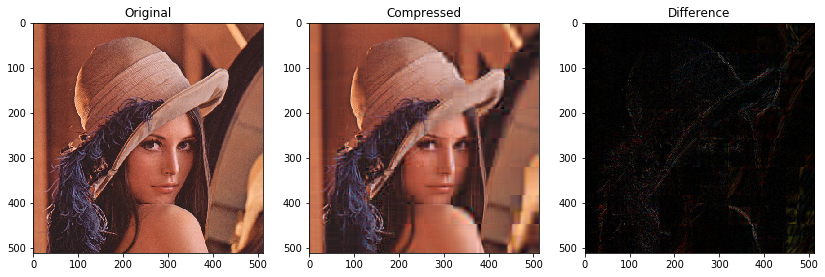

Average Rank Used: 4.62
Average Percentage of Ranks Used: 7.227%
PSNR Value: 27.4707020327
MSE of Image difference: 116.415325716


Compression with no centering of data
Compression Using Grid Technique With grid = (64, 64) and ratio of sum = 0.55


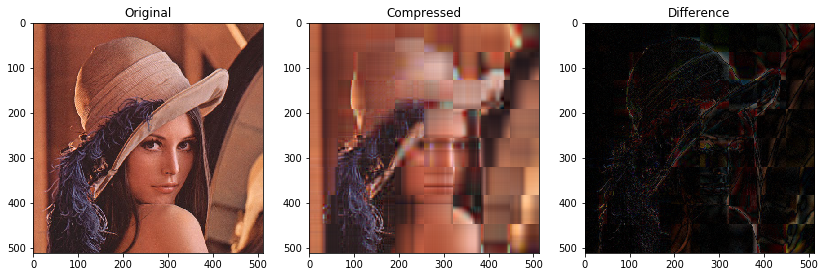

Average Rank Used: 1.96
Average Percentage of Ranks Used: 3.068%
PSNR Value: 23.3026201401
MSE of Image difference: 303.961337517


In [14]:
"""
Change file name and "gray" flag if required.
"""
lenna = open_image('lenna.jpg', gray=False)
print(lenna.shape)
SHAPE = (lenna.shape[0],lenna.shape[1])
# Choose values of k, which here is the grid size considered. 
# Can call compress_by_grid with rectangular grid size as well.
k_vals = (8, 16, 32, 64, 128)
avg_rank_nc, avg_rank_c = [], []
perc_rank_nc, perc_rank_c = [], []
psnr_nc, psnr_c = [], []
mse_nc, mse_c = [], []
for i in k_vals:
    rep = False
    if i in (8,32,64):
        rep = True
    rec, org, stats = compress_by_grid(lenna, grid_size=(i,i), perc_t=0.55, center=True, show_report=rep)
    avg_rank_c.append(stats['avg_rank'])
    perc_rank_c.append(stats['perc_rank'])
    psnr_c.append(stats['psnr'])
    mse_c.append(stats['mse'])
    if rep:
        print('\n\nCompression with no centering of data')
    rec, org, stats = compress_by_grid(lenna, grid_size=(i,i), perc_t=0.55, center=False, show_report=rep)
    avg_rank_nc.append(stats['avg_rank'])
    perc_rank_nc.append(stats['perc_rank'])
    psnr_nc.append(stats['psnr'])
    mse_nc.append(stats['mse'])

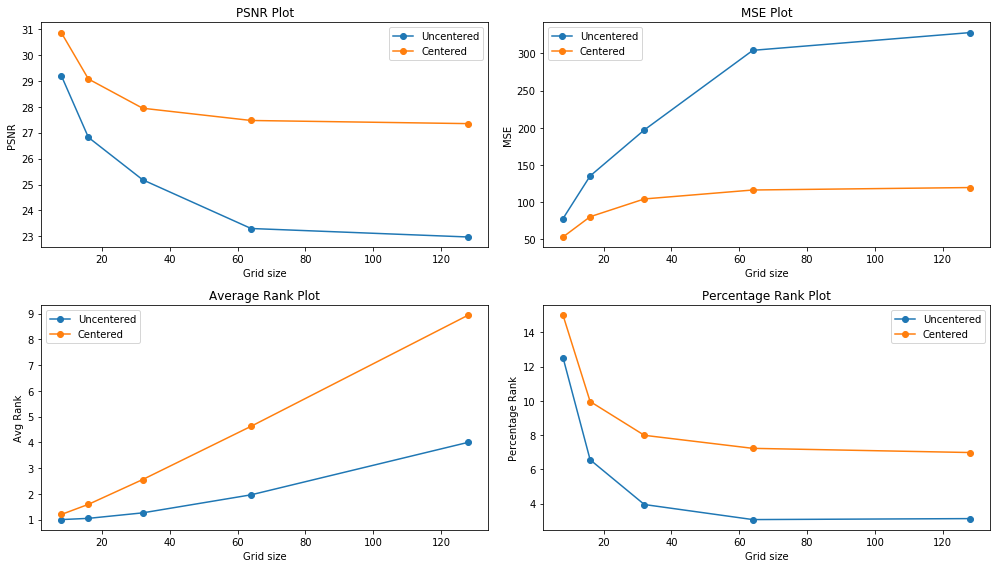

In [15]:
'''
Code to plot the statistics
'''

plt.rcParams["figure.figsize"] = [14,8]
plt.subplot(221)
plt.title('PSNR Plot')
plt.xlabel('Grid size')
plt.ylabel('PSNR')
nc, = plt.plot(k_vals, psnr_nc,'-o', label='Uncentered');
c, = plt.plot(k_vals, psnr_c,'-o', label='Centered');
plt.legend(handles=[nc,c])

plt.subplot(222)
plt.title('MSE Plot')
plt.xlabel('Grid size')
plt.ylabel('MSE')
nc, = plt.plot(k_vals, mse_nc, '-o', label='Uncentered');
c, = plt.plot(k_vals, mse_c, '-o', label='Centered');
plt.legend(handles=[nc,c])

plt.subplot(223)
plt.title('Average Rank Plot')
plt.xlabel('Grid size')
plt.ylabel('Avg Rank')
nc, = plt.plot(k_vals, avg_rank_nc, '-o', label='Uncentered');
c, = plt.plot(k_vals, avg_rank_c, '-o', label='Centered');
plt.legend(handles=[nc,c])

plt.subplot(224)
plt.title('Percentage Rank Plot')
plt.xlabel('Grid size')
plt.ylabel('Percentage Rank')
nc, = plt.plot(k_vals, perc_rank_nc, '-o', label='Uncentered');
c, = plt.plot(k_vals, perc_rank_c, '-o', label='Centered');
plt.legend(handles=[nc,c])
plt.tight_layout()
plt.show()

### 2. Showing effect of varying percentage of cumulative sum of Singular Values with constant grid size (16,16)
####    We also see the effects of centering the image data

(512, 512, 3)
Compression Using Grid Technique With grid = (16, 16) and ratio of sum = 0.85


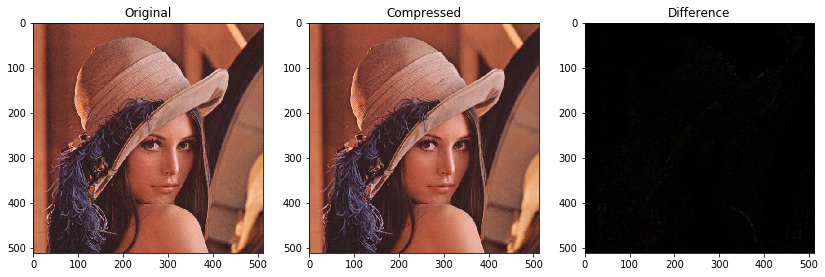

Average Rank Used: 4.36
Average Percentage of Ranks Used: 27.252%
PSNR Value: 37.2982247536
MSE of Image difference: 12.1131720423


Compression with no centering of data
Compression Using Grid Technique With grid = (16, 16) and ratio of sum = 0.85


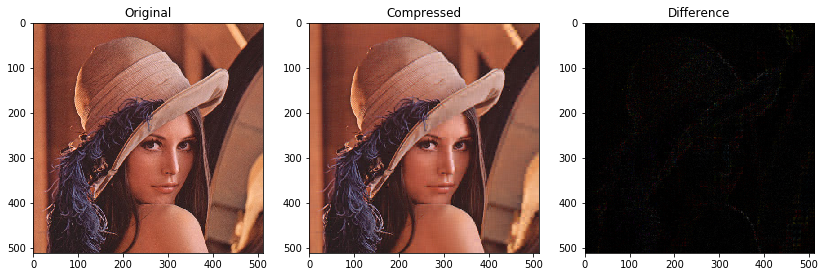

Average Rank Used: 2.30
Average Percentage of Ranks Used: 14.366%
PSNR Value: 33.0152360883
MSE of Image difference: 32.4755677297
Compression Using Grid Technique With grid = (16, 16) and ratio of sum = 0.775


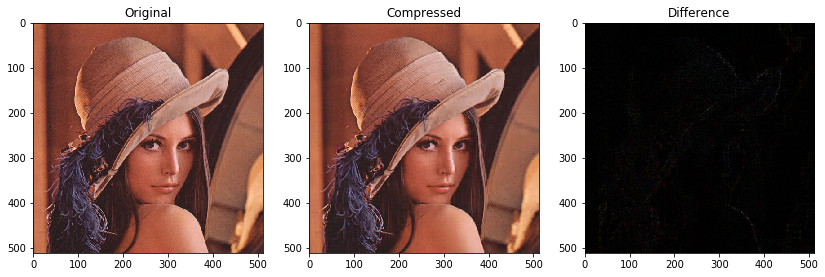

Average Rank Used: 3.17
Average Percentage of Ranks Used: 19.818%
PSNR Value: 34.226879674
MSE of Image difference: 24.5692779495


Compression with no centering of data
Compression Using Grid Technique With grid = (16, 16) and ratio of sum = 0.775


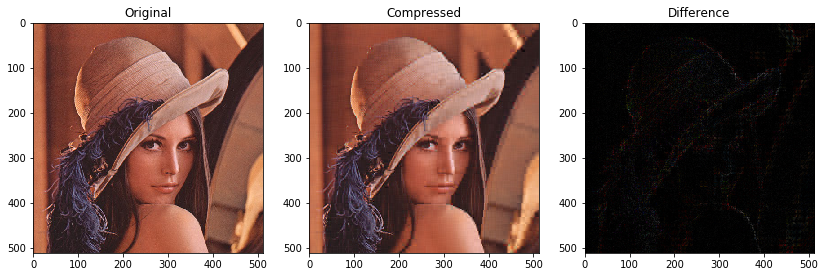

Average Rank Used: 1.59
Average Percentage of Ranks Used: 9.957%
PSNR Value: 30.2796745842
MSE of Image difference: 60.9695377618
Compression Using Grid Technique With grid = (16, 16) and ratio of sum = 0.7


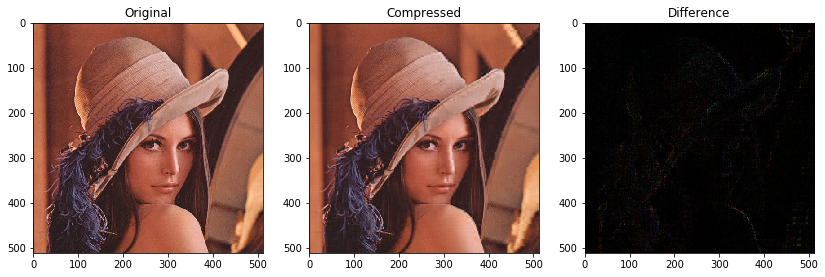

Average Rank Used: 2.41
Average Percentage of Ranks Used: 15.086%
PSNR Value: 31.9273335795
MSE of Image difference: 41.7202596775


Compression with no centering of data
Compression Using Grid Technique With grid = (16, 16) and ratio of sum = 0.7


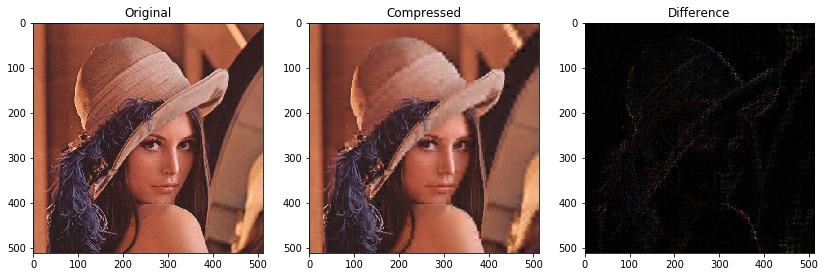

Average Rank Used: 1.28
Average Percentage of Ranks Used: 8.012%
PSNR Value: 28.6112305347
MSE of Image difference: 89.5276752523


In [16]:
lenna = open_image('lenna.jpg', gray=False)
print(lenna.shape)
SHAPE = (lenna.shape[0],lenna.shape[1])
# Here k_vals is the threshold percentage.
k_vals = (0.85, 0.8125, 0.775, 0.7375, 0.7)
avg_rank_nc, avg_rank_c = [], []
perc_rank_nc, perc_rank_c = [], []
psnr_nc, psnr_c = [], []
mse_nc, mse_c = [], []
for i in k_vals:
    rep = False
    if i in (0.85, 0.775, 0.7):
        rep = True
    rec, org, stats = compress_by_grid(lenna, grid_size=(16,16), perc_t=i, center=True, show_report=rep)
    avg_rank_c.append(stats['avg_rank'])
    perc_rank_c.append(stats['perc_rank'])
    psnr_c.append(stats['psnr'])
    mse_c.append(stats['mse'])
    if rep:
        print('\n\nCompression with no centering of data')
    rec, org, stats = compress_by_grid(lenna, grid_size=(16,16), perc_t=i, center=False, show_report=rep)
    avg_rank_nc.append(stats['avg_rank'])
    perc_rank_nc.append(stats['perc_rank'])
    psnr_nc.append(stats['psnr'])
    mse_nc.append(stats['mse'])

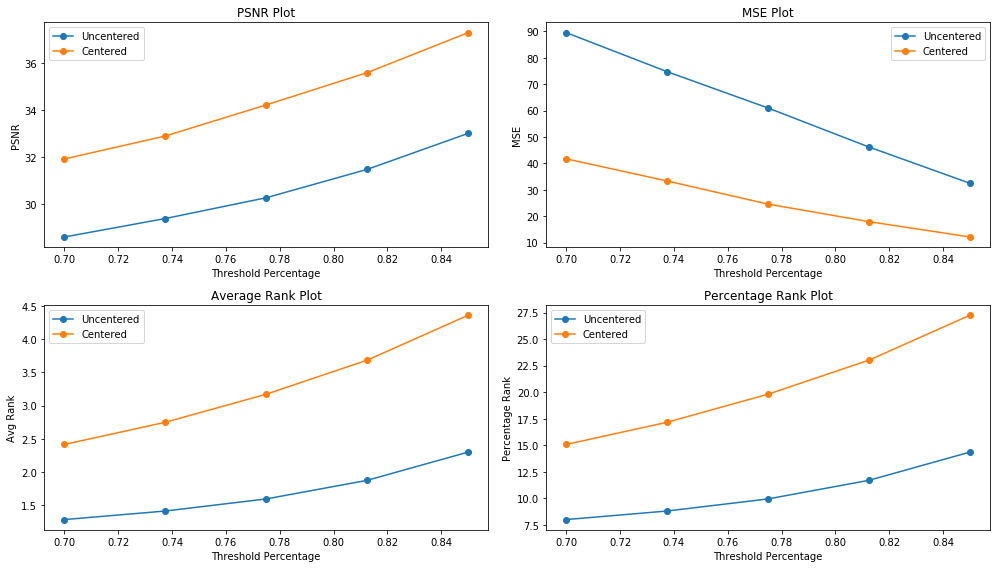

In [17]:
plt.rcParams["figure.figsize"] = [14,8]
plt.subplot(221)
plt.title('PSNR Plot')
plt.xlabel('Threshold Percentage')
plt.ylabel('PSNR')
nc, = plt.plot(k_vals, psnr_nc,'-o', label='Uncentered');
c, = plt.plot(k_vals, psnr_c,'-o', label='Centered');
plt.legend(handles=[nc,c])

plt.subplot(222)
plt.title('MSE Plot')
plt.xlabel('Threshold Percentage')
plt.ylabel('MSE')
nc, = plt.plot(k_vals, mse_nc, '-o', label='Uncentered');
c, = plt.plot(k_vals, mse_c, '-o', label='Centered');
plt.legend(handles=[nc,c])

plt.subplot(223)
plt.title('Average Rank Plot')
plt.xlabel('Threshold Percentage')
plt.ylabel('Avg Rank')
nc, = plt.plot(k_vals, avg_rank_nc, '-o', label='Uncentered');
c, = plt.plot(k_vals, avg_rank_c, '-o', label='Centered');
plt.legend(handles=[nc,c])

plt.subplot(224)
plt.title('Percentage Rank Plot')
plt.xlabel('Threshold Percentage')
plt.ylabel('Percentage Rank')
nc, = plt.plot(k_vals, perc_rank_nc, '-o', label='Uncentered');
c, = plt.plot(k_vals, perc_rank_c, '-o', label='Centered');
plt.legend(handles=[nc,c])
plt.tight_layout()
plt.show()

# Comparing SVD using grid and non-adaptive techniques

### a. Demonstrating SVD with grid technique (grayscale)

(512, 512)
Compression Using Grid Technique With grid = (16, 16) and ratio of sum = 0.75


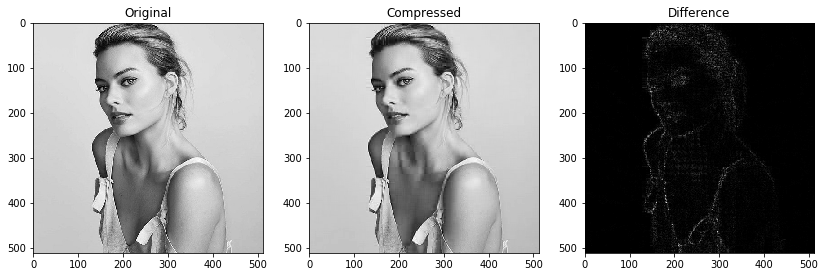

Average Rank Used: 1.87
Average Percentage of Ranks Used: 11.700%
PSNR Value: 32.9927819336
MSE of Image difference: 32.6439096752


In [18]:
"""
Get to test any image here. Choose any image as desired, grid size, perc_t (threshold percentage)
centering, and see the results.
"""
file_name = 'mrobbie.jpg'
mrobbie = open_image(file_name, gray=True)
print(mrobbie.shape)
SHAPE = (mrobbie.shape[0],mrobbie.shape[1])
rec, org, stats = compress_by_grid(mrobbie, grid_size=(16,16), perc_t=0.75, center=True)

### b. Demonstrating SVD with non-adaptive technique on same image (grayscale)

(512, 512)
Compression Using Normal Technique With k = 60


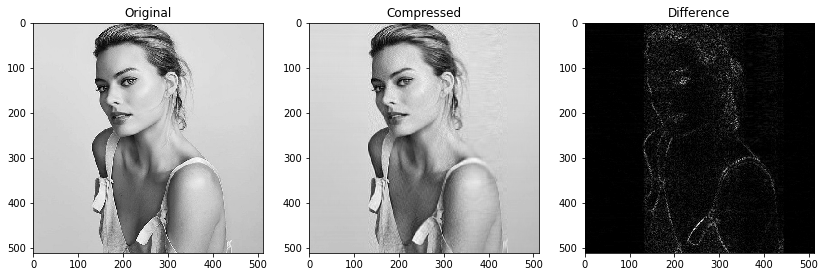

PSNR Value: 30.9883741519
MSE of Image difference: 51.7896463823


In [19]:
file_name = 'mrobbie.jpg'
mrobbie = open_image(file_name, gray=True)
print(mrobbie.shape)
SHAPE = (mrobbie.shape[0],mrobbie.shape[1])
# Using k ~ 11.7% of 512 ~ 60
# This is because in grid based, it used 11.7% average rank.
rec, org, stats = compress_non_adaptive(mrobbie, k=60, center=True)

### c. Grid technique with small grid size, no centering (RGB image)

#### Also shows the algorithms work on non-square images.

(428, 570, 3)
Compression Using Grid Technique With grid = (8, 8) and ratio of sum = 0.95


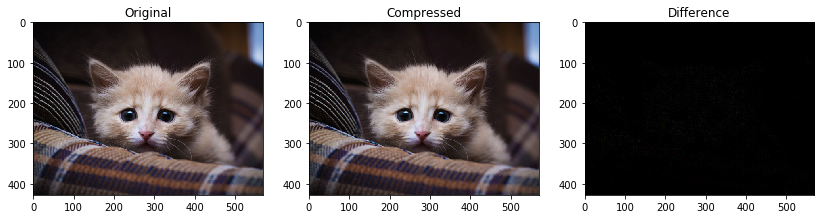

Average Rank Used: 1.83
Average Percentage of Ranks Used: 22.866%
PSNR Value: 42.1100800527
MSE of Image difference: 4.00011388079


In [20]:
file_name = 'cat.png'
cat = open_image(file_name, gray=False)
print(cat.shape)
SHAPE = (cat.shape[0],cat.shape[1])
rec, org, stats = compress_by_grid(cat, grid_size=(8,8), perc_t=0.95, center=False)

### d. Non-adaptive technique with similar technique, fairly high number of k

(428, 570, 3)
Compression Using Normal Technique With k = 98


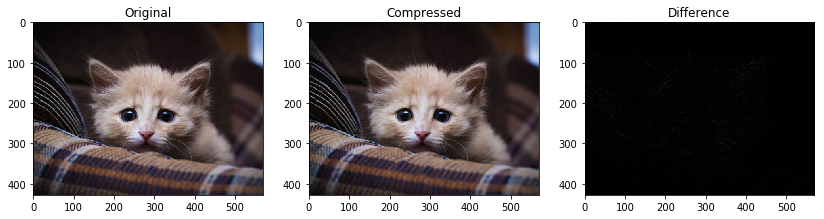

PSNR Value: 38.731447476
MSE of Image difference: 8.70834474001


In [21]:
file_name = 'cat.png'
cat = open_image(file_name, gray=False)
print(cat.shape)
SHAPE = (cat.shape[0],cat.shape[1])
# Using k ~ 22.866% of 428 ~ 98
# This is because in grid based, it used 22.866% average rank.
rec, org, stats = compress_non_adaptive(cat, k=98, center=False)

### e. Grid technique with moderate grid size and high threshold percentage

(512, 512, 3)
Compression Using Grid Technique With grid = (16, 16) and ratio of sum = 0.85


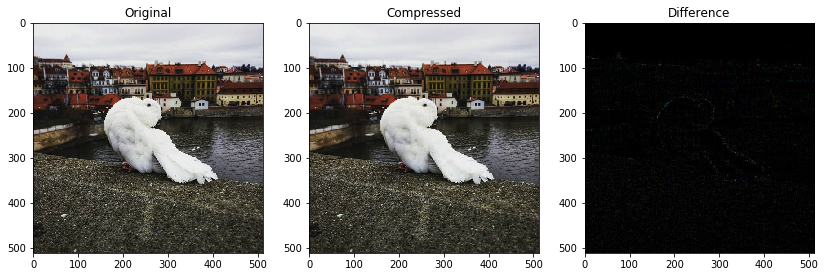

Average Rank Used: 4.28
Average Percentage of Ranks Used: 26.756%
PSNR Value: 33.8390872788
MSE of Image difference: 26.8640590231


In [30]:
file_name = 'pigeon.jpg'
nb = open_image(file_name, gray=False)
print(nb.shape)
SHAPE = (nb.shape[0],nb.shape[1])
rec, org, stats = compress_by_grid(nb, grid_size=(16,16), perc_t=0.85, center=True)

### f. Non-adaptive technique with moderate k value

(512, 512, 3)
Compression Using Normal Technique With k = 137


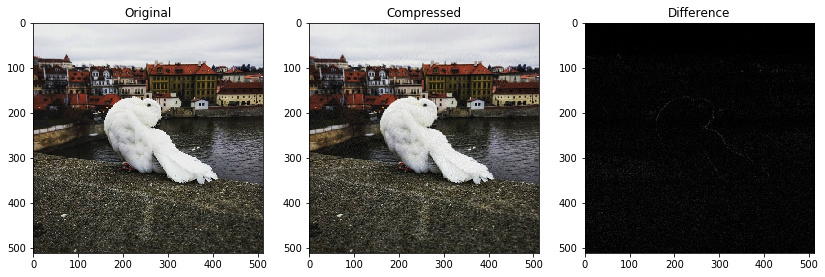

PSNR Value: 30.9863342522
MSE of Image difference: 51.8139779135


In [31]:
file_name = 'pigeon.jpg'
nb = open_image(file_name, gray=False)
print(nb.shape)
SHAPE = (nb.shape[0],nb.shape[1])
rec, org, stats = compress_non_adaptive(nb, k=137, center=True)

### g. Grid technique with large grid size and low threshold percentage

(500, 500, 3)
Compression Using Grid Technique With grid = (50, 50) and ratio of sum = 0.5


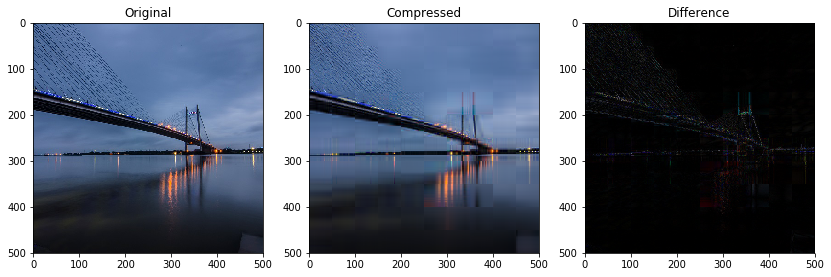

Average Rank Used: 2.71
Average Percentage of Ranks Used: 5.413%
PSNR Value: 28.9133165732
MSE of Image difference: 83.5119651888


In [24]:
file_name = 'kolkata.jpg'
nb = open_image(file_name, gray=False)
print(nb.shape)
SHAPE = (nb.shape[0],nb.shape[1])
rec, org, stats = compress_by_grid(nb, grid_size=(50,50), perc_t=0.5, center=True)

### h. Non-adaptive technique with low k value

(500, 500, 3)
Compression Using Normal Technique With k = 27


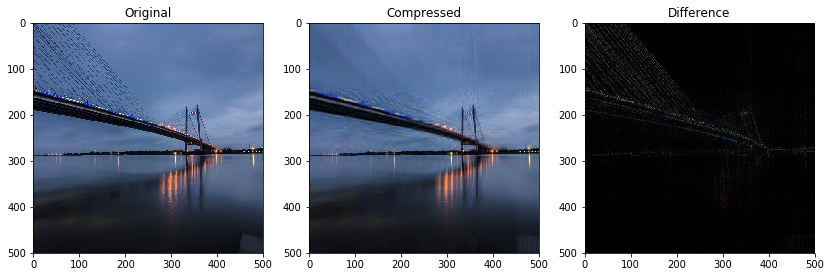

PSNR Value: 27.9924259339
MSE of Image difference: 103.237568545


In [25]:
file_name = 'kolkata.jpg'
nb = open_image(file_name, gray=False)
print(nb.shape)
SHAPE = (nb.shape[0],nb.shape[1])
rec, org, stats = compress_non_adaptive(nb, k=27, center=True)

### i. Demonstrating SVD compression on a tall image with non-square (rectangular) grid

(900, 604, 3)
Compression Using Grid Technique With grid = (60, 20) and ratio of sum = 0.6


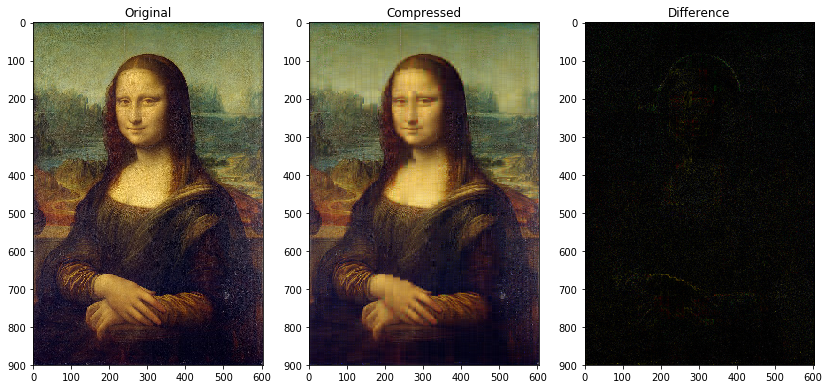

Average Rank Used: 4.20
Average Percentage of Ranks Used: 21.011%
PSNR Value: 29.3822536321
MSE of Image difference: 74.9643876274


In [26]:
file_name = 'monalisa.jpg'
nb = open_image(file_name, gray=False)
print(nb.shape)
SHAPE = (nb.shape[0],nb.shape[1])
rec, org, stats = compress_by_grid(nb, grid_size=(60,20), perc_t=0.6, center=True)

### j. Demonstrating non-adaptive SVD compression on the same image as above

(900, 604, 3)
Compression Using Normal Technique With k = 127


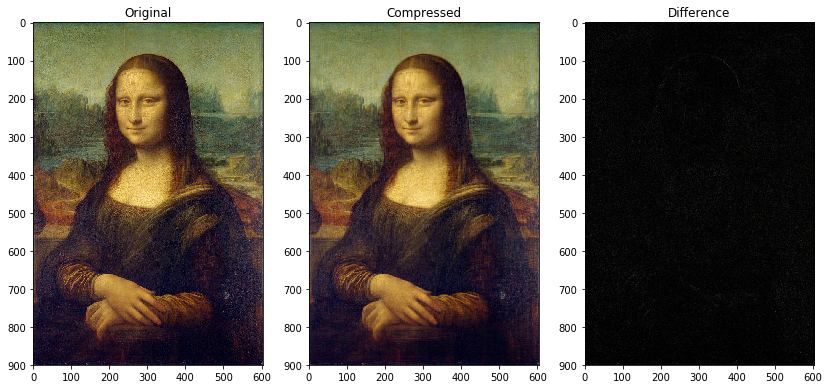

PSNR Value: 30.2521293337
MSE of Image difference: 61.357467709


In [27]:
file_name = 'monalisa.jpg'
nb = open_image(file_name, gray=False)
print(nb.shape)
SHAPE = (nb.shape[0],nb.shape[1])
rec, org, stats = compress_non_adaptive(nb, k=127, center=True)

### k. Using a rectangular grid on a square image, with high threshold percentage

(512, 512, 3)
Compression Using Grid Technique With grid = (32, 24) and ratio of sum = 0.75


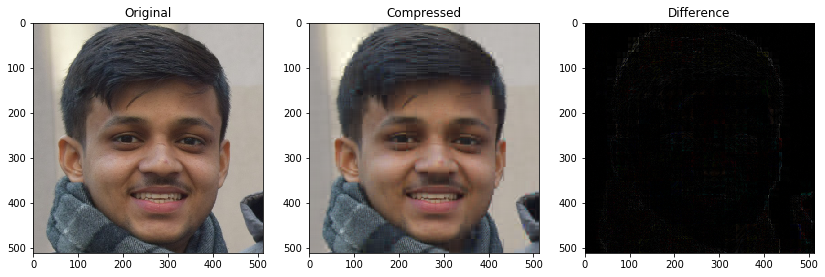

Average Rank Used: 1.96
Average Percentage of Ranks Used: 8.176%
PSNR Value: 34.5069474704
MSE of Image difference: 23.03486195


In [28]:
file_name = 'divyam.jpg'
nb = open_image(file_name, gray=False)
print(nb.shape)
SHAPE = (nb.shape[0],nb.shape[1])
rec, org, stats = compress_by_grid(nb, grid_size=(32,24), perc_t=0.75, center=True)

### l. General SVD compression on that same image with suitable k

(512, 512, 3)
Compression Using Normal Technique With k = 42


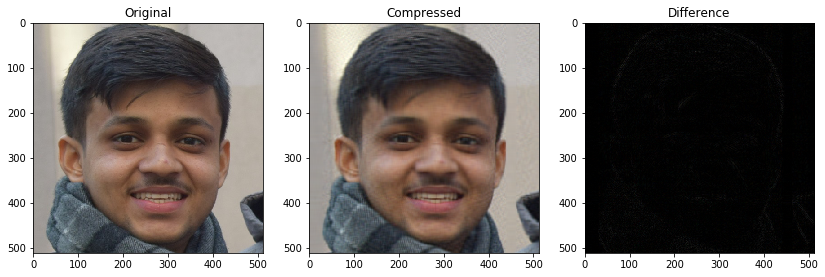

PSNR Value: 35.5537083206
MSE of Image difference: 18.1012901066


In [29]:
file_name = 'divyam.jpg'
nb = open_image(file_name, gray=False)
print(nb.shape)
SHAPE = (nb.shape[0],nb.shape[1])
rec, org, stats = compress_non_adaptive(nb, k=42, center=True)